In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import json
from textblob import TextBlob
%matplotlib inline

Load the dataset

In [5]:
with open("/Users/christoskallaras/code/personal/claimer_detection/squad/train-v2.0.json", "r") as f:
    data = json.load(f)

Alter the format of the file to more readable form and load it to a pandas dataframe

In [6]:
processed_data = []
for entry in data["data"]:
    title = entry["title"]
    for paragraph in entry["paragraphs"]:
        context = paragraph["context"]
        for qa in paragraph["qas"]:
            question = qa["question"]
            answer = qa["answers"][0]["text"] if qa["answers"] else None
            is_impossible = qa["is_impossible"]
            plausible_answers = [answer["text"] for answer in qa["plausible_answers"]] if is_impossible else []
            processed_data.append({"title": title, "context": context, "question": question, "answer": answer, "is_impossible": is_impossible, "plausible_answers": plausible_answers})
df = pd.DataFrame(processed_data)
df.head(5)

,title,context,question,answer,is_impossible,plausible_answers
0,Beyoncé,Beyoncé Giselle Knowles-Carter (/biːˈjɒnseɪ/ b...,When did Beyonce start becoming popular?,in the late 1990s,False,[]
1,Beyoncé,Beyoncé Giselle Knowles-Carter (/biːˈjɒnseɪ/ b...,What areas did Beyonce compete in when she was...,singing and dancing,False,[]
2,Beyoncé,Beyoncé Giselle Knowles-Carter (/biːˈjɒnseɪ/ b...,When did Beyonce leave Destiny's Child and bec...,2003,False,[]
3,Beyoncé,Beyoncé Giselle Knowles-Carter (/biːˈjɒnseɪ/ b...,In what city and state did Beyonce grow up?,"Houston, Texas",False,[]
4,Beyoncé,Beyoncé Giselle Knowles-Carter (/biːˈjɒnseɪ/ b...,In which decade did Beyonce become famous?,late 1990s,False,[]


Create a barplot to see the proportion of questions with answer on the text or not

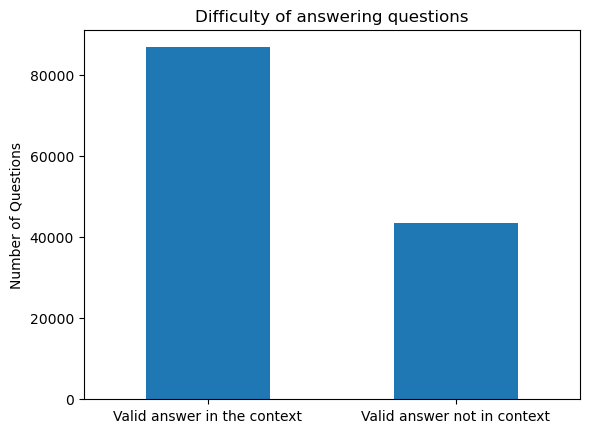

In [62]:
df["is_impossible"].replace({True: "Valid answer not in context", False: "Valid answer in the context"}, inplace=True)
df["is_impossible"].value_counts().plot(kind="bar")
plt.title("Difficulty of answering questions")
plt.ylabel("Number of Questions")
plt.xticks(rotation=0)
plt.show()

Most questions have an answer in the text. The dataset has provided the field "is_impoossible" that give us informations about the difficulty of answering the question that can also be used to evaluate the performance of machine reading comprehension models in handling questions that do not have an answer.

Find the length of the questions and plot a boxplot

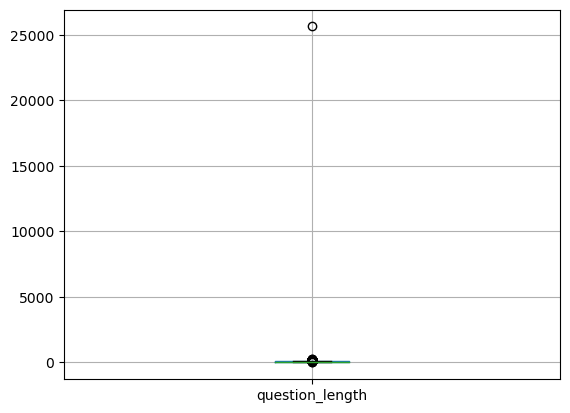

In [53]:
df["question_length"] = df["question"].str.len()
df.boxplot(column=["question_length"])
plt.show()

Do a scatter plot with the question length and the answer length

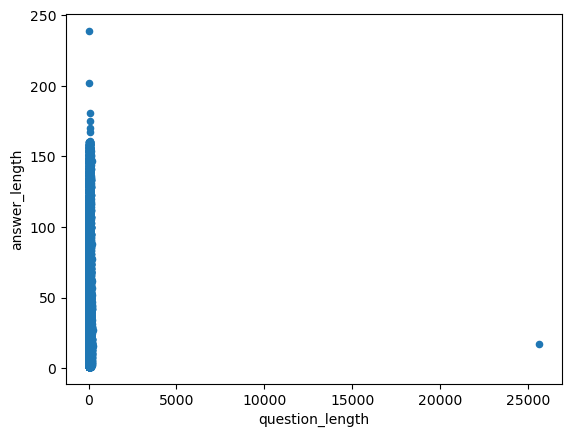

In [54]:
df["answer_length"] = df["answer"].str.len()
df.plot.scatter(x="question_length", y="answer_length")
plt.show()

Drop the na volumn values for the remaining visualisations

In [9]:
# Data cleaning
df.dropna(inplace=True)

Analyze the sentiment of the "answer" column and plot the results. 

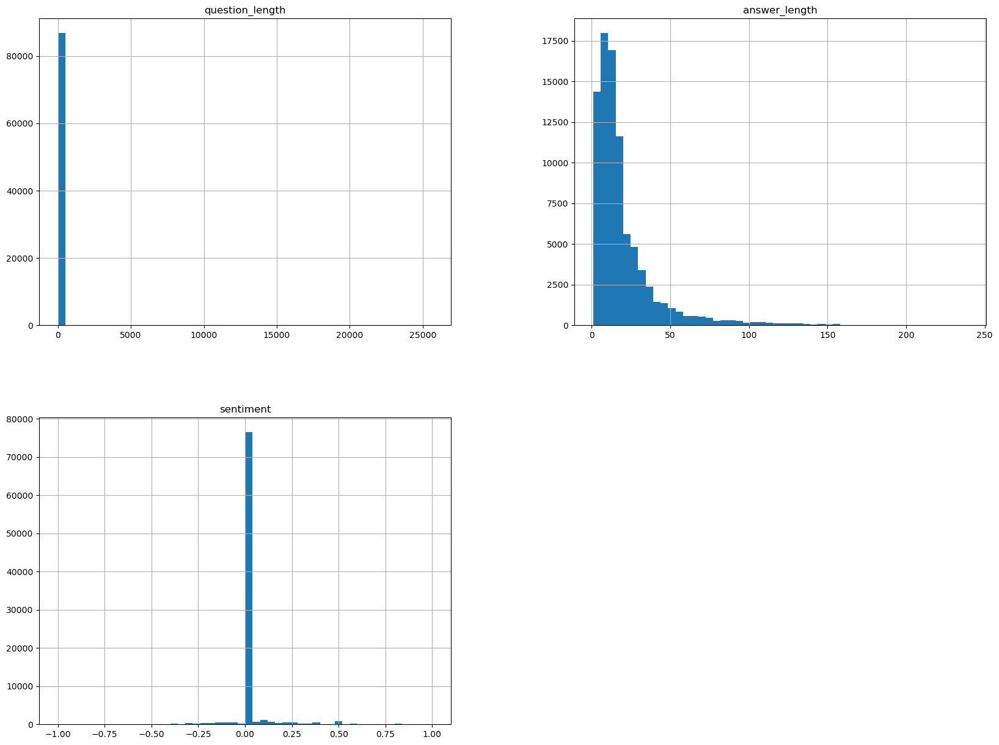

In [56]:
# sentiment analysis
df["sentiment"] = df["answer"].apply(lambda x: TextBlob(x).sentiment.polarity)
df.hist(bins=50, figsize=(20,15))
plt.show()

Find how many questions are sking about someone or something

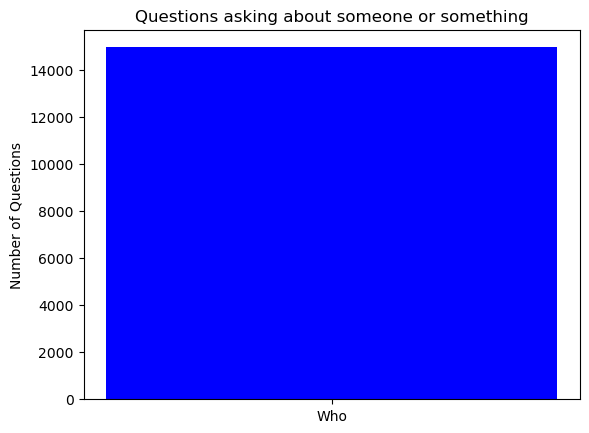

In [73]:
# Count the number of questions asking "Who said something"
count = 0
for question in df["question"]:
    if "Who" in question or "who" in question:
        count += 1

# Plot the number of questions asking "Who said something"
plt.bar(["Who"], [count], color = "blue")

# Add labels and title
plt.ylabel("Number of Questions")
plt.title("Questions asking about someone or something")

# Show the plot
plt.show()   k k

Create word clouds of the answer and question column to visualize the most frequently used words.

In [3]:
# Wordclouds
from wordcloud import WordCloud
from gensim.parsing.preprocessing import STOPWORDS

def plot_wordcloud(text, title):
    wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = set(STOPWORDS), 
                min_font_size = 10).generate(text)
    
    # plot the WordCloud image                        
    plt.figure(figsize = (8, 8), facecolor = None) 
    plt.imshow(wordcloud) 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.title(title)
    plt.show()

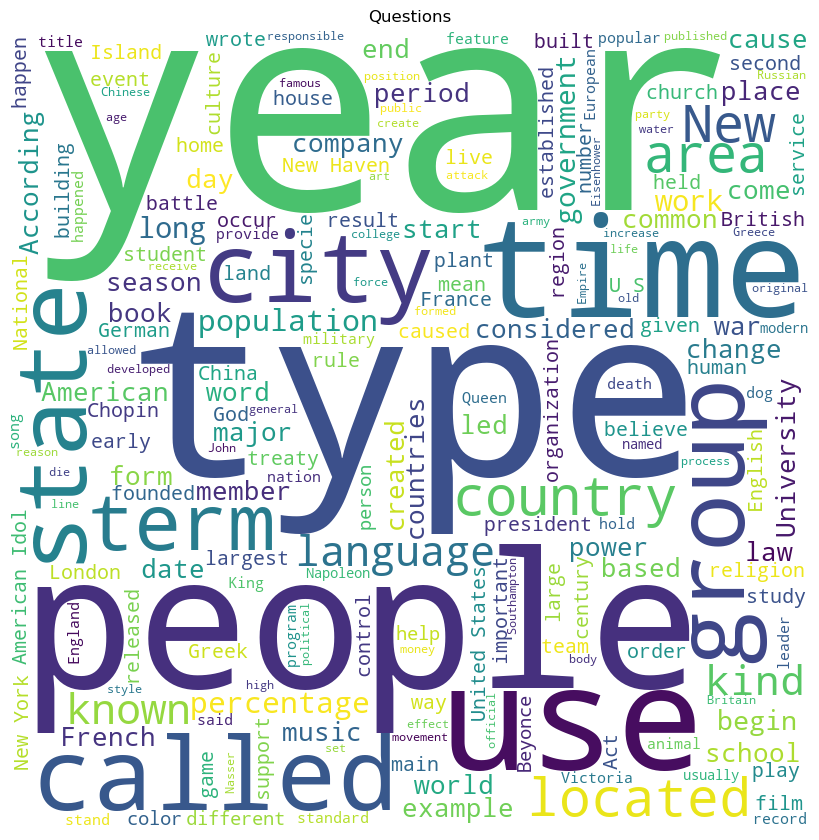

In [10]:
# Plot wordclouds for questions, answers, contexts, and titles
questions = " ".join(df['question'].tolist())
plot_wordcloud(questions, "Questions")

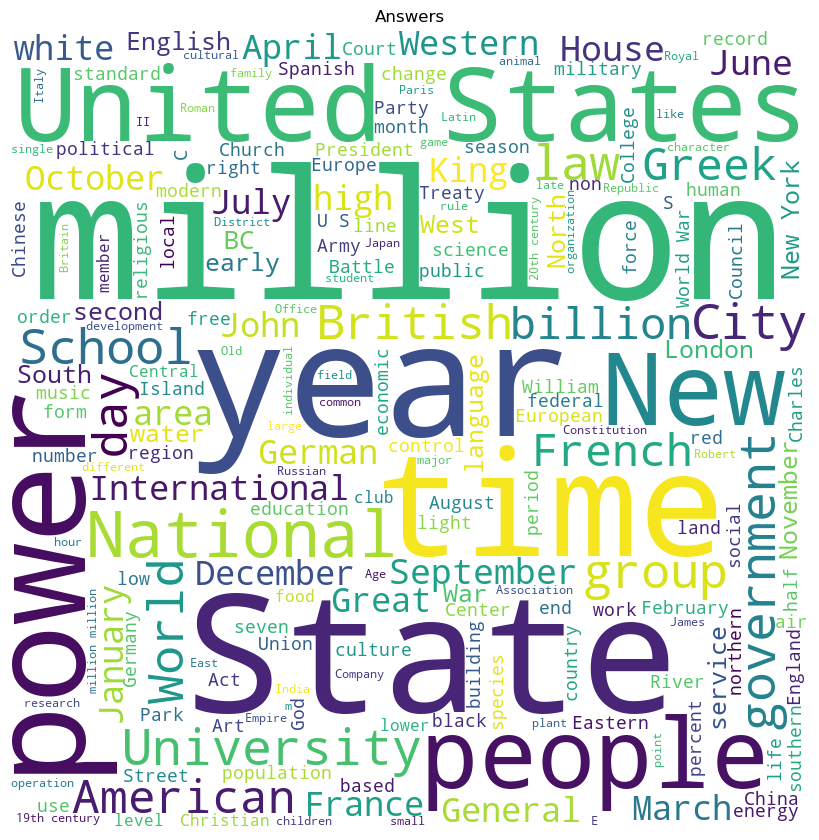

In [11]:
answers = " ".join(df['answer'].tolist())
plot_wordcloud(answers, "Answers")

Using the topic modeling techniques Latent Dirichlet Allocation (LDA), identify the main topics in the "answer" column. 

In [23]:
import gensim
from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS
from gensim import corpora, models

def preprocess(text):
    result = []
    for token in gensim.utils.simple_preprocess(text):
        if token not in gensim.parsing.preprocessing.STOPWORDS and len(token) > 3:
            result.append(token)
    return result

processed_answers = df["answer"].map(preprocess)
dictionary = gensim.corpora.Dictionary(processed_answers)
bow_corpus = [dictionary.doc2bow(answer) for answer in processed_answers]

lda_model = gensim.models.LdaMulticore(bow_corpus, num_topics=10, id2word=dictionary, passes=2, workers=2)
for idx, topic in lda_model.print_topics(-1):
    print("Topic: {} \nWords: {}".format(idx, topic))


Topic: 0 
Words: 0.022*"billion" + 0.015*"union" + 0.015*"hunting" + 0.014*"western" + 0.011*"modern" + 0.010*"soviet" + 0.009*"seven" + 0.008*"association" + 0.008*"religion" + 0.007*"life"
Topic: 1 
Words: 0.026*"state" + 0.023*"university" + 0.022*"british" + 0.017*"party" + 0.015*"east" + 0.013*"july" + 0.013*"water" + 0.011*"april" + 0.011*"india" + 0.010*"february"
Topic: 2 
Words: 0.020*"empire" + 0.018*"south" + 0.015*"year" + 0.015*"high" + 0.014*"school" + 0.014*"time" + 0.012*"roman" + 0.012*"june" + 0.012*"group" + 0.012*"king"
Topic: 3 
Words: 0.020*"government" + 0.019*"people" + 0.015*"french" + 0.014*"political" + 0.011*"september" + 0.009*"china" + 0.009*"kingdom" + 0.008*"culture" + 0.008*"local" + 0.008*"southern"
Topic: 4 
Words: 0.048*"century" + 0.020*"greek" + 0.016*"great" + 0.016*"early" + 0.014*"percent" + 0.014*"france" + 0.012*"army" + 0.010*"central" + 0.008*"times" + 0.008*"britain"
Topic: 5 
Words: 0.049*"million" + 0.034*"united" + 0.029*"states" + 0.018

In [29]:
import pyLDAvis
import pyLDAvis.gensim_models

vis = pyLDAvis.gensim_models.prepare(lda_model, bow_corpus, dictionary)
pyLDAvis.display(vis)

/Users/christoskallaras/opt/anaconda3/lib/python3.9/site-packages/pyLDAvis/_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(
/Users/christoskallaras/opt/anaconda3/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/Users/christoskallaras/opt/anaconda3/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/Users/christoskallaras/opt/anaconda3/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import relo

/Users/christoskallaras/opt/anaconda3/lib/python3.9/site-packages/joblib/backports.py:36: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/Users/christoskallaras/opt/anaconda3/lib/python3.9/site-packages/joblib/backports.py:36: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(np.__version__) < '1.13':
/Users/christoskallaras/opt/anaconda3/lib/python3.9/site-packages/setuptools/_distutils/version.py:346: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)
/Users/christoskallaras/opt/anaconda3/lib/python3.9/site-packages/setuptools/_distutils/version.py:346: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)
/Users/christoskallaras/opt/anaconda3/lib/python3.9/site-packages/joblib/backports.py:36: De

Use Named Entity Recognition (NER) with spacy to identify entities such as people, organizations, and locations in the "answer" column.

In [39]:
import spacy
import en_core_web_sm

nlp = spacy.load("en_core_web_sm")

def extract_entities(text):
    doc = nlp(text)
    entities = [(entity.text, entity.label_) for entity in doc.ents]
    return entities

df["entities"] = df["answer"].apply(extract_entities)


Plot a network graph of the entities identified using NER to visualize the relationships between them. 

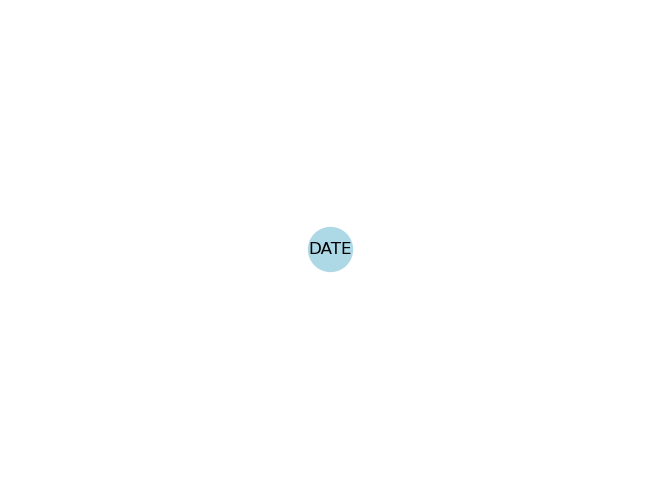

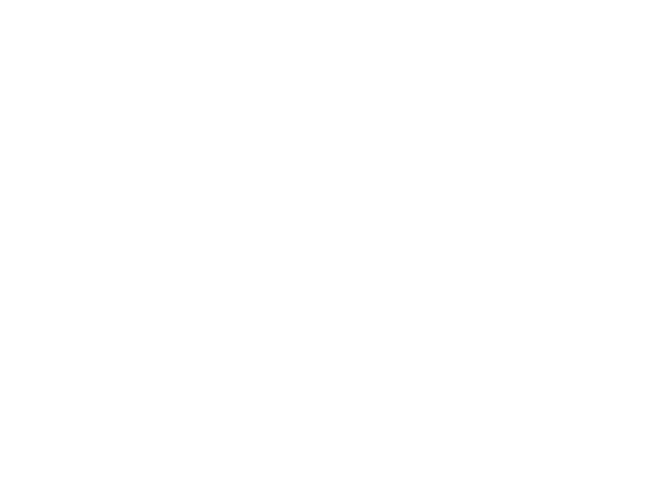

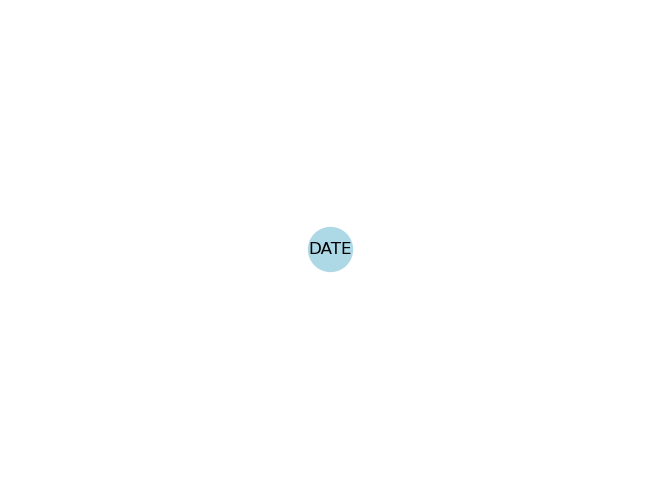

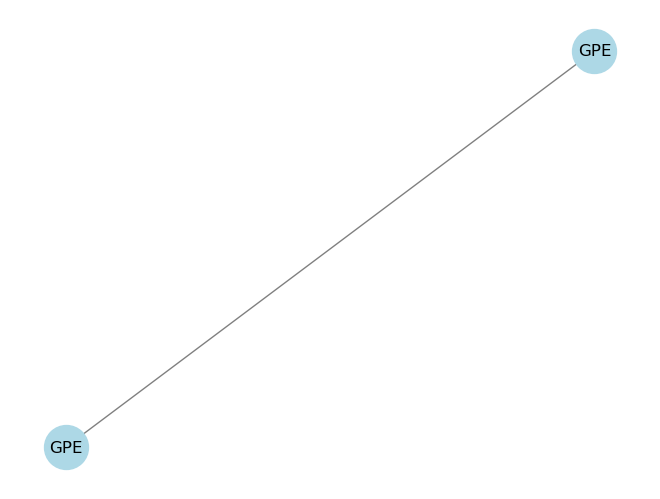

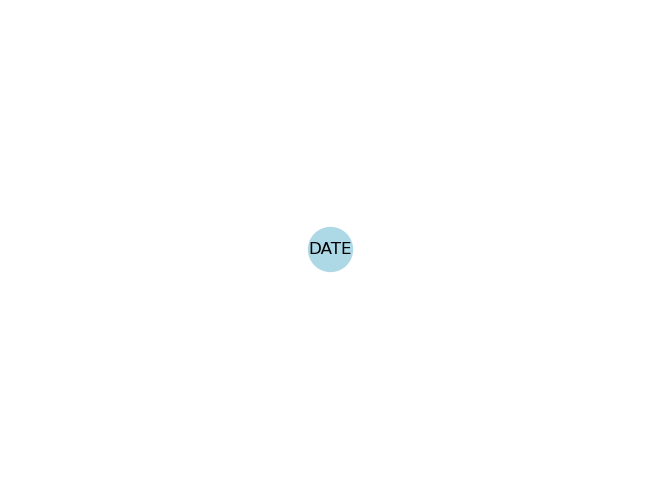

...

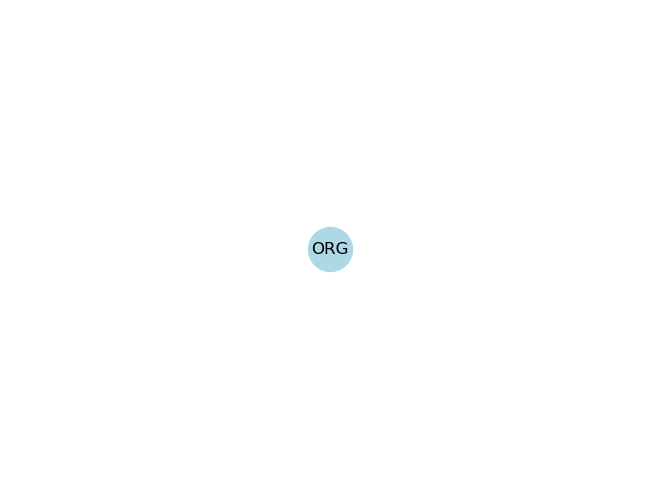

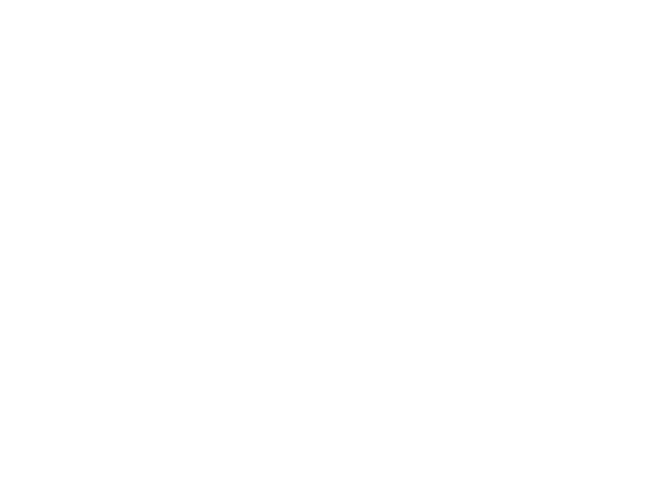

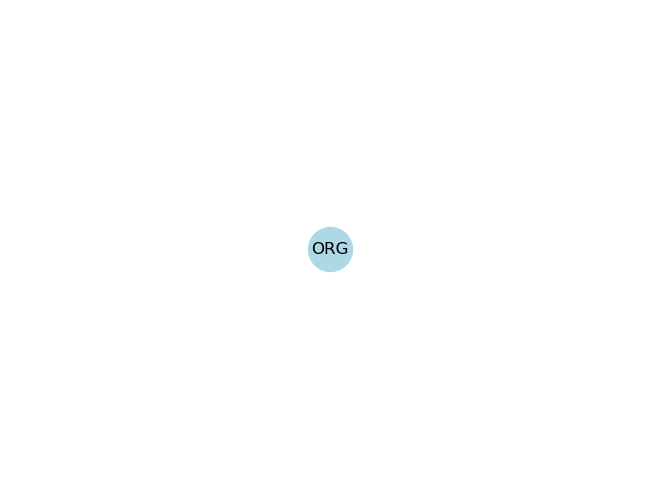

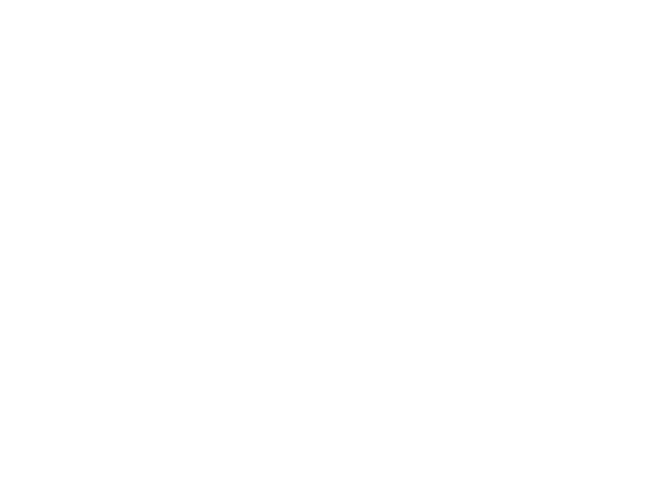

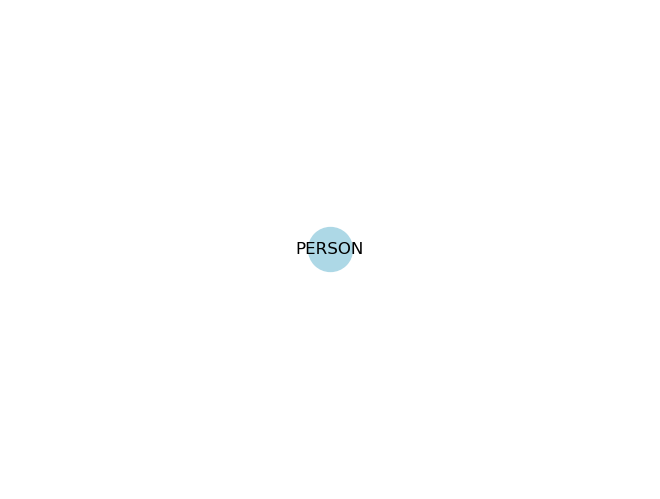

KeyboardInterrupt: 

<Figure size 640x480 with 0 Axes>

In [40]:
import networkx as nx
import matplotlib.pyplot as plt

def plot_network(entities):
    G = nx.Graph()
    for entity, label in entities:
        G.add_node(entity, label=label)
    edges = [(entities[i][0], entities[j][0]) for i in range(len(entities)) for j in range(i+1, len(entities))]
    G.add_edges_from(edges)
    labels = {node: node if label == "O" else label for node, label in nx.get_node_attributes(G, "label").items()}
    pos = nx.spring_layout(G)
    nx.draw(G, pos, node_color="lightblue", edge_color="gray", node_size=1000, with_labels=True, labels=labels)
    plt.show()
    
df.apply(lambda row: plot_network(row["entities"]), axis=1)
